In [1]:
import torch
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
from tqdm.auto import tqdm
from torch import autocast
from PIL import Image
import cv2
import numpy as np
import math
import random
import bisect
import operator

/home/kobayashi/anaconda3/envs/pytorch/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.21.self_attn.q_proj.weight', 'vision_model.encoder.layers.8.mlp.fc2.weight', 'vision_model.encoder.layers.4.mlp.fc1.bias', 'vision_model.encoder.layers.23.layer_norm2.bias', 'vision_model.encoder.layers.20.mlp.fc1.weight', 'text_projection.weight', 'vision_model.encoder.layers.11.self_attn.q_proj.bias', 'vision_model.encoder.layers.21.layer_norm2.bias', 'vision_model.encoder.layers.19.mlp.fc2.bias', 'vision_model.encoder.layers.16.self_attn.out_proj.weight', 'vision_model.encoder.layers.20.layer_norm1.bias', 'vision_model.encoder.layers.7.self_at

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


In [3]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

In [4]:
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

In [123]:
def func(latents,prompt):
    height = 512                        # default height of Stable Diffusion
    width = 512                         # default width of Stable Diffusion

    num_inference_steps = 100            # Number of denoising steps

    guidance_scale = 7.5                # Scale for classifier-free guidance

    # generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

    batch_size = 1

    #########################################


    text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

    #text_inputの値を変更
    # text_input.input_ids[0][8]=4500

    with torch.no_grad():
      text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]


    #############################################

    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

    ###############################################

    embeddings = torch.cat([uncond_embeddings, text_embeddings])

    #############################################

#     latents_torch32 = torch.randn(
#       (batch_size, unet.in_channels, height // 8, width // 8),
#       generator=torch.manual_seed(32),
#     )
#     latents = latents_torch32.to(torch_device)
#     latents_torch100 = torch.randn(
#       (batch_size, unet.in_channels, height // 8, width // 8),
#       generator=torch.manual_seed(100),
#     )
#     latents100 = latents_torch100.to(torch_device)
#     latents[0][0][0][0] = latents100[0][0][0][0]
#     for i in range(4):
#         latents[0][i][:63] = latents100[0][i][:63]


    #############################################

    scheduler.set_timesteps(num_inference_steps)

    ##########################################

    latents_1 = latents * scheduler.init_noise_sigma

    #############################################



    for t in tqdm(scheduler.timesteps):
      # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
      latent_model_input_a = torch.cat([latents_1] * 2)

      latent_model_input = scheduler.scale_model_input(latent_model_input_a, t)

      # predict the noise residual
      with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=embeddings).sample

      # perform guidance
      noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
      noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

      # compute the previous noisy sample x_t -> x_t-1
      latents_1 = scheduler.step(noise_pred, t, latents_1).prev_sample

    ###############################################

    # scale and decode the image latents with vae
    latents_3 = 1 / 0.18215 * latents_1

    with torch.no_grad():
      image = vae.decode(latents_3).sample


    ##########################################

    image_1 = (image / 2 + 0.5).clamp(0, 1)
    image_2 = image_1.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image_2 * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    result_image = pil_images[0]
    
    return result_image

In [182]:
#gaの関数
population = 21 #個体数
generations = 50 #世代数
X = 3
Y = 7
# population = 3 #個体数
# generations = 2 #世代数
# X = 1
# Y = 3
gene_length = 64
elite = 1 #エリートの数
def pil2cv(image):
    ''' PIL型 -> OpenCV型 '''
    new_image = np.array(image, dtype=np.uint8)
    if new_image.ndim == 2:  # モノクロ
        pass
    elif new_image.shape[2] == 3:  # カラー
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGB2BGR)
    elif new_image.shape[2] == 4:  # 透過
        new_image = cv2.cvtColor(new_image, cv2.COLOR_RGBA2BGRA)
    return new_image


#最大42 大きければ大きいほどよい
def calc_fitness(target,images):
    fitness = []
    for image in images:
        target_hist = cv2.calcHist([target], [0], None, [256], [0, 256])
        comparing_hist = cv2.calcHist([pil2cv(image)], [0], None, [256], [0, 256])
        ret = cv2.compareHist(target_hist, comparing_hist, 0)
        ans = 25*(np.exp(max(0,ret)))-24 #適合度の式
        fitness.append(int(ans))
    return fitness

#seed値を複数個用意
def initialize_gene():
    arr = []
    for i in range(population):
        seed_here = random.randrange(1000)
        latents_torch = torch.randn(
          (batch_size, unet.in_channels, height // 8, width // 8),
          generator=torch.manual_seed(seed_here),
        )
        latents = latents_torch.to(torch_device)
        arr.append(latents)    
    return arr


def show_image(images,epoch):
    fig = plt.figure()
    for i in range(len(images)):
        arrPIL = np.asarray(images[i])
        ax1 = fig.add_subplot(X, Y, i+1)
        ax1.set_title(str(i))
        ax1.axis("off")
        plt.imshow(arrPIL)
    print(epoch)
    plt.savefig("iec/{}.png".format(epoch))
    plt.show()
    
    
def evolve(fitness,genes):
    new_genes = []
    #エリート戦略
    elite_array = []
    for i in range(population):
        elite_array.append([fitness[i],genes[i]])
    elite_array = sorted(elite_array, key=operator.itemgetter(0))
    elite_array = list(reversed(elite_array))
    for i in range(elite):
        new_genes.append(elite_array[i][1])
    # cross over
    index = []
    num = 0
    for i in range(population):
        num += fitness[i]
        index.append(num)
    index.append(num)
    for i in range(population-elite):
        p1 = random.randrange(num)
        p2 = random.randrange(num)
        g1 = bisect.bisect(index,p1)
        g2 = bisect.bisect(index,p2)
        new_gene = genes[g1].clone()
        new_gene1 = genes[g2].clone()
        print(g1,g2)
        cross = random.randrange(gene_length)
#         new_gene[0][0][:cross] = genes[g1][0][0][:cross]
        for j in range(4):
            for k in range(64):
                for l in range(64):
                    a = random.randrange(2)
                    if a==0:
                        new_gene[0][j][k][l] = new_gene1[0][j][k][l]
        new_genes.append(new_gene)
                    

        
    #mutation
    #エリートは変異させない
    for i in range(elite,population):
        for j in range(4):
            for k in range(64):
                for l in range(64):
                    num = random.randrange(4*64*64)
                    if num==0:
                        new_genes[i][0][j][k][l] = np.random.randn()
#     # Figuring initial time step based on strength
#     mutate = random.randrange(population)
#     init_timestep = mutation_genes_variation
#     timesteps = scheduler.timesteps[-init_timestep]
#     timesteps = torch.tensor([timesteps], device="cuda")
#     seed_here = random.randrange(1000)
#     torch.manual_seed(seed_here)
#     # Adding noise to the latents 
#     noise = torch.randn(new_genes[mutate].shape, generator=None, device="cuda", dtype=new_genes[mutate].dtype)
#     new_genes[mutate] = scheduler.add_noise(new_genes[mutate], noise, timesteps)
#     torch.manual_seed(seed)
    return new_genes

100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


0


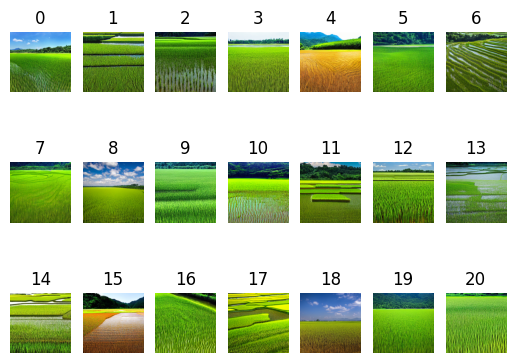

3 0
2 11
7 2
3 14
1 0
6 0
14 2
4 0
0 15
1 12
3 8
3 1
15 11
0 2
16 16
5 1
0 11
15 15
6 1
16 6


100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


1


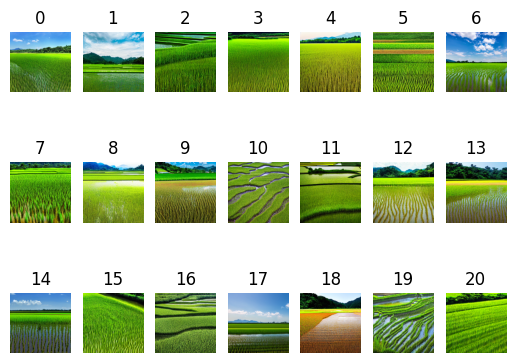

19 16
18 3
1 9
8 3
6 1
6 15
4 0
4 0
10 17
9 4
6 20
2 14
14 8
18 8
1 1
17 17
3 5
8 0
7 1
7 18


100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


2


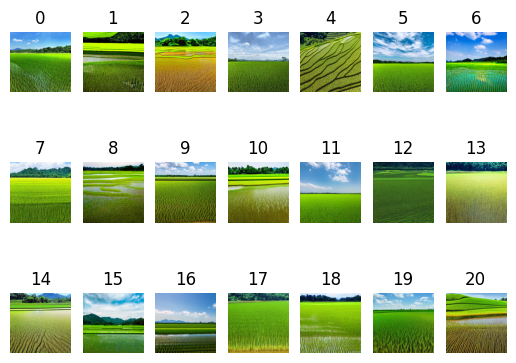

6 17
18 3
0 15
15 19
19 6
11 20
7 19
15 0
9 5
15 17
17 19
19 10
20 5
17 7
4 2
3 15
6 15
15 17
0 19
18 6


100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


3


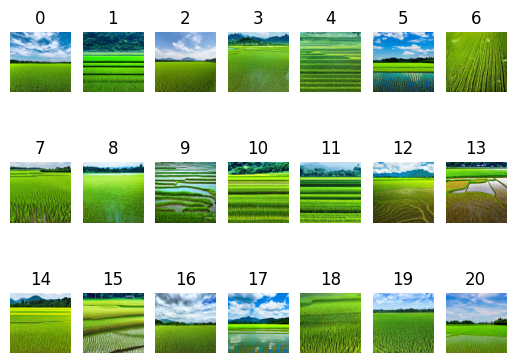

17 11
16 16
16 16
16 17
0 18
18 20
5 5
12 16
11 11
16 16
9 11
0 6
17 11
15 16
13 13
16 16
16 6
6 17
16 2
0 0


100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


4


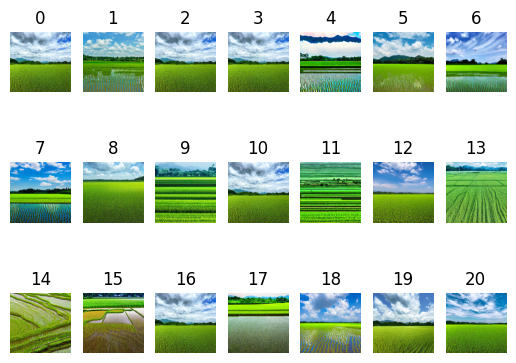

18 16
6 10
3 20
11 7
14 18
19 0
2 12
8 0
2 0
3 2
3 3
4 18
16 9
18 12
5 2
8 3
14 10
3 0
5 6
20 10


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


5


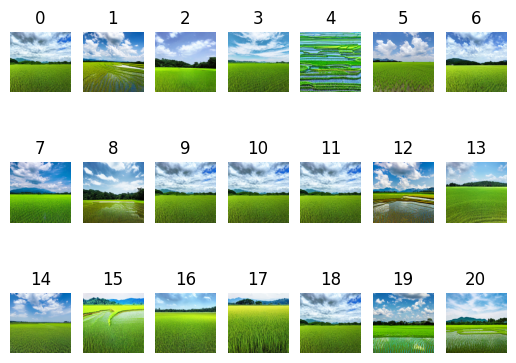

0 8
6 4
11 9
5 12
4 8
18 15
7 0
3 9
1 9
1 16
1 9
10 11
11 18
10 6
16 7
7 0
5 13
18 7
8 13
11 3


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


6


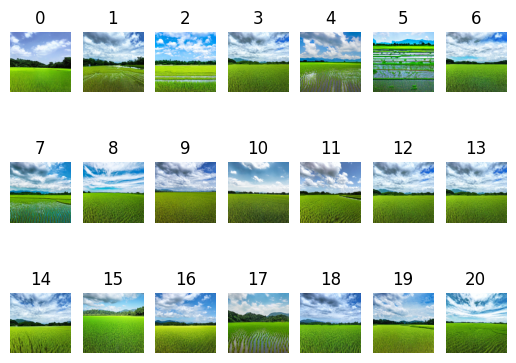

14 17
0 18
1 1
0 13
13 16
12 17
1 1
0 5
7 20
13 20
7 16
18 6
2 13
1 19
5 9
18 0
13 0
3 0
16 9
12 18


100%|██████████| 100/100 [00:19<00:00,  5.11it/s]


7


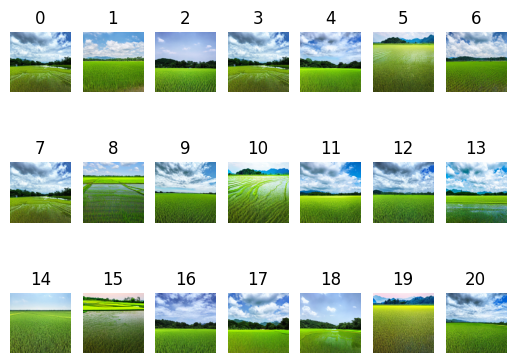

3 10
3 7
17 17
3 11
3 11
6 13
11 14
8 7
20 0
7 12
16 6
20 14
4 8
7 6
13 12
1 2
20 9
0 3
18 10
4 19


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


8


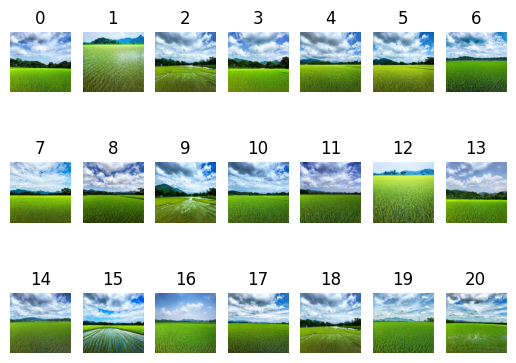

10 4
18 10
8 20
0 19
17 3
2 14
13 9
10 15
17 15
4 17
6 16
8 6
7 11
14 18
16 15
0 2
3 8
4 5
6 9
9 6


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


9


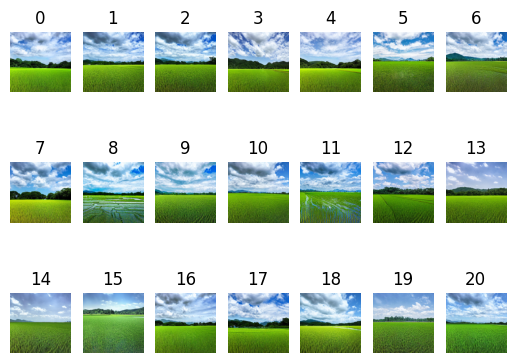

1 13
1 11
13 18
18 6
16 10
4 4
11 18
4 2
3 20
18 12
0 3
0 13
12 20
6 12
1 13
17 0
19 4
9 9
19 0
18 0


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


10


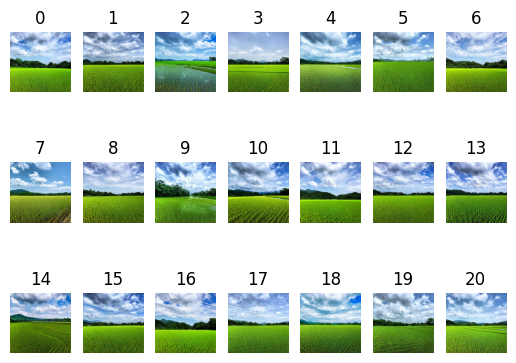

18 0
15 5
7 5
1 19
20 5
12 6
0 16
18 18
13 18
6 14
20 5
9 15
19 13
13 17
6 10
13 0
12 4
6 19
15 16
17 4


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


11


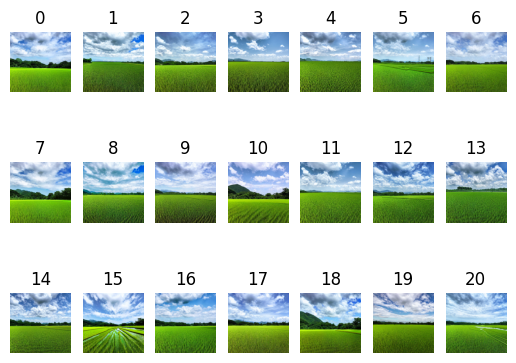

18 10
4 1
0 7
6 20
0 5
16 0
11 20
9 20
11 19
13 7
14 12
17 20
15 13
3 17
14 1
14 11
7 20
12 2
20 12
16 10


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


12


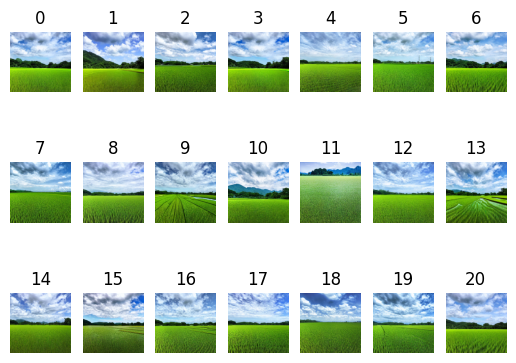

14 18
10 6
4 3
20 5
13 20
1 7
12 5
2 4
14 19
8 6
17 2
7 5
9 20
7 8
4 14
3 18
0 13
2 6
20 4
0 19


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


13


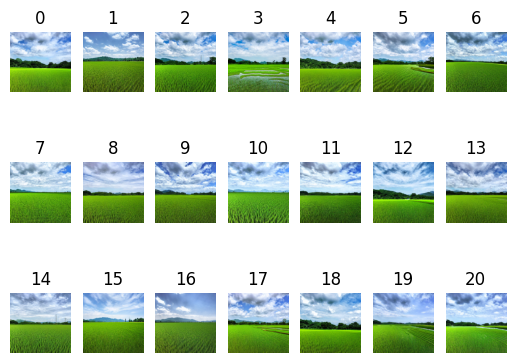

11 9
17 7
1 11
2 6
11 9
7 5
11 8
1 20
20 20
13 12
3 12
2 20
19 5
1 13
8 16
8 18
2 0
7 14
17 7
12 14


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


14


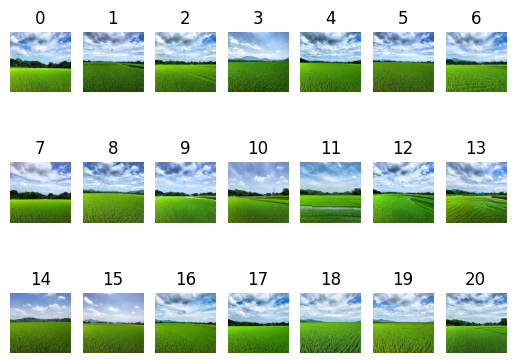

10 10
20 17
14 13
15 14
4 20
10 2
0 11
20 11
5 11
19 5
7 4
4 10
18 10
12 6
0 5
14 2
3 12
4 5
11 7
8 7


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


15


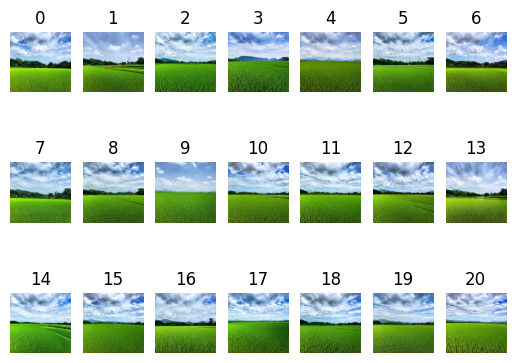

1 0
13 5
1 6
6 5
2 2
7 6
5 1
12 15
20 11
19 13
12 12
12 5
6 8
11 14
2 20
13 17
20 15
20 0
8 6
20 9


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


16


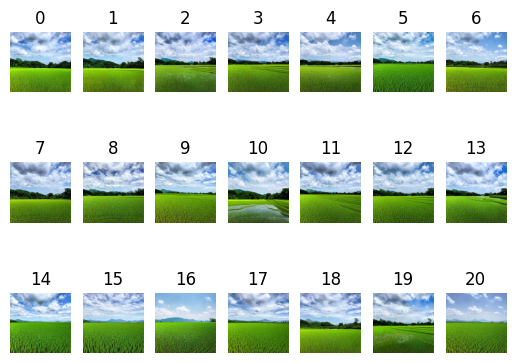

9 8
11 7
5 5
14 14
7 5
20 1
11 1
0 3
17 19
17 17
17 0
13 0
3 10
5 12
12 11
2 13
5 4
13 3
6 7
13 15


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


17


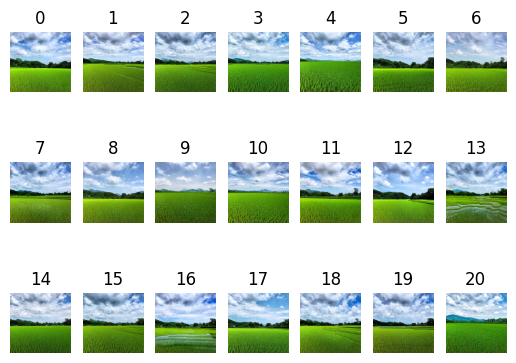

17 1
5 6
8 4
8 5
18 8
17 14
6 18
15 20
6 9
5 0
10 6
0 5
9 7
2 5
1 19
12 16
0 2
15 12
12 10
20 0


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


18


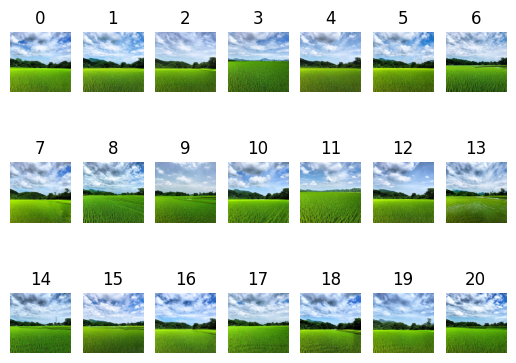

1 14
18 20
0 19
12 0
16 18
14 0
9 2
8 4
18 8
8 0
7 8
11 0
6 9
6 2
2 3
11 14
20 1
1 19
18 9
1 7


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


19


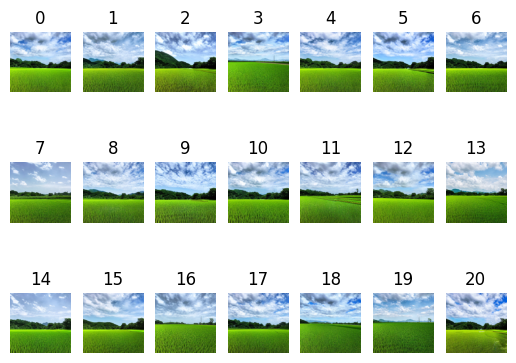

1 0
12 4
19 18
8 6
13 10
12 13
14 10
4 1
3 15
19 6
1 12
3 9
3 17
12 8
12 10
7 3
8 20
8 7
3 17
14 6


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


20


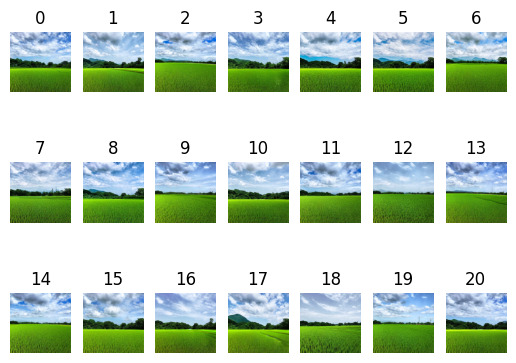

16 6
20 2
4 7
4 20
13 13
4 4
12 10
4 18
9 17
3 13
1 10
9 16
2 18
7 5
2 10
4 2
19 16
7 8
20 19
1 16


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


21


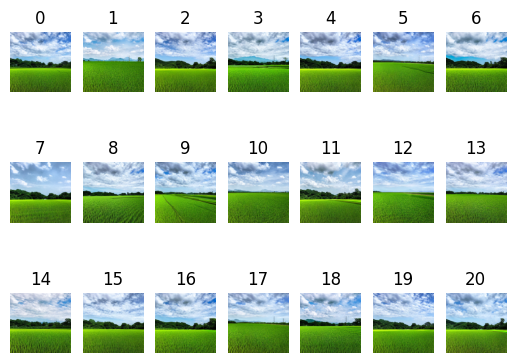

14 13
4 2
17 13
6 10
19 5
5 4
15 3
2 7
15 10
5 7
13 19
14 13
19 5
4 8
18 17
7 13
7 6
18 9
7 15
4 4


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


22


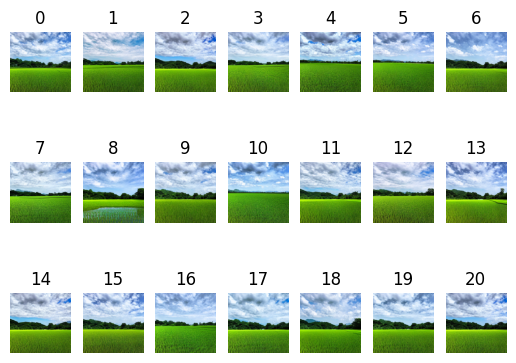

6 18
0 10
12 2
18 17
16 9
16 16
13 19
16 20
5 4
8 14
13 6
7 10
4 4
8 5
12 6
12 5
0 10
9 14
0 0
1 5


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


23


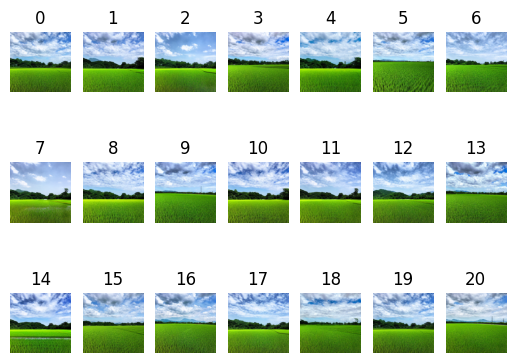

9 0
4 2
5 18
17 3
12 16
6 12
16 11
2 20
2 15
9 17
15 7
19 12
18 10
11 5
18 6
9 0
6 14
5 14
14 6
0 16


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


24


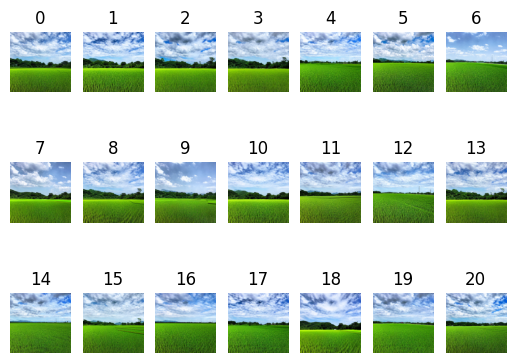

8 0
18 6
0 14
20 6
7 20
0 3
15 6
5 0
5 15
0 11
10 5
2 2
0 15
10 18
7 0
11 12
0 0
2 18
5 7
11 7


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


25


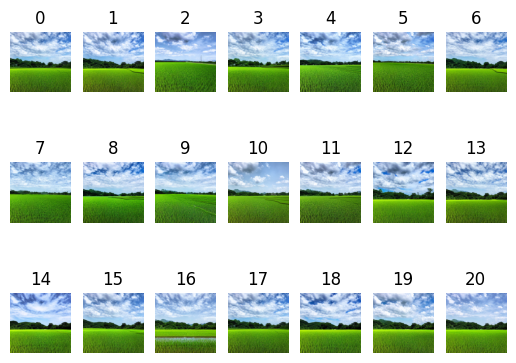

17 16
13 1
5 9
13 7
0 9
1 12
12 9
12 8
10 18
10 18
1 16
20 10
17 12
12 17
14 20
11 8
16 3
3 20
9 7
0 3


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


26


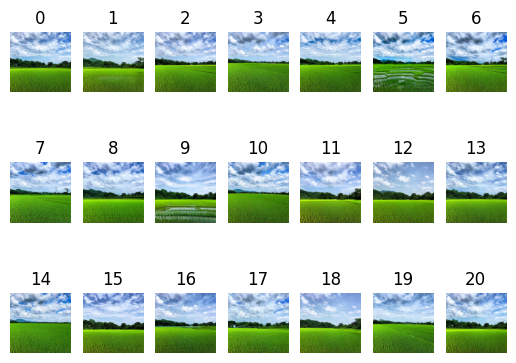

9 10
17 5
16 6
10 19
1 9
0 1
2 14
15 0
9 15
4 8
16 10
6 14
13 13
6 20
10 9
1 19
6 2
1 7
11 11
15 16


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


27


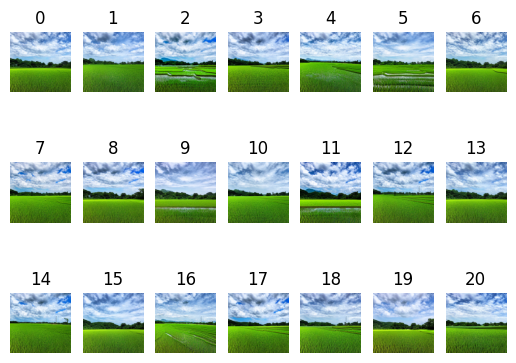

19 18
20 6
0 12
15 6
6 20
3 1
13 9
15 13
10 0
12 4
10 4
20 10
6 10
18 6
15 20
6 10
18 14
10 17
4 15
4 14


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


28


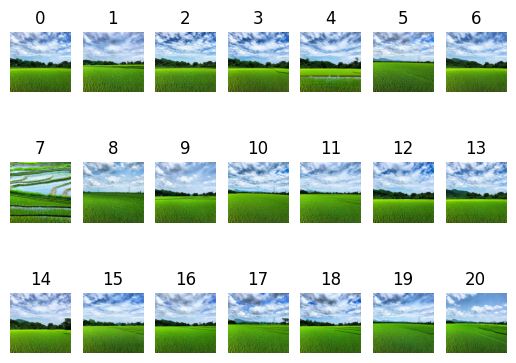

17 14
2 4
16 13
3 13
15 16
10 9
15 20
20 3
14 15
18 12
14 5
18 16
15 18
11 14
17 18
0 3
11 10
17 13
17 2
5 19


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


29


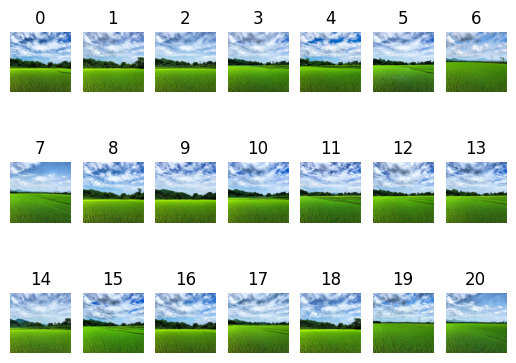

4 14
0 6
1 16
12 17
3 15
15 10
1 16
12 2
5 20
12 3
20 4
14 17
13 2
18 13
0 12
13 0
13 10
11 1
12 3
6 1


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


30


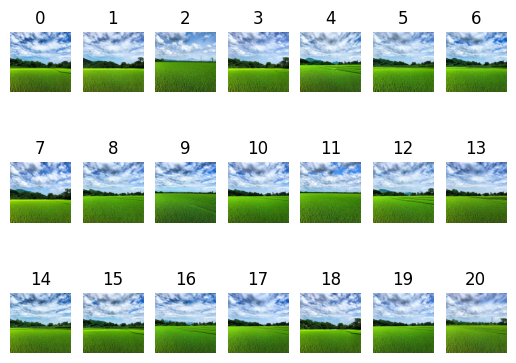

0 15
19 15
12 8
1 2
10 16
4 20
8 7
11 16
7 20
4 7
17 20
13 4
4 3
15 0
15 19
0 12
13 7
19 1
13 4
16 11


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


31


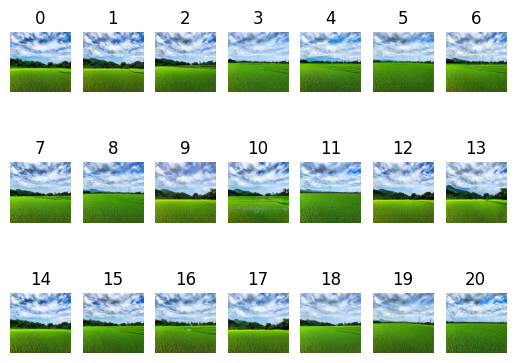

9 4
12 15
7 17
4 19
3 18
14 16
13 12
20 8
2 15
10 14
20 7
19 1
9 13
15 1
1 0
5 14
8 2
12 18
0 7
10 20


100%|██████████| 100/100 [00:19<00:00,  5.12it/s]


32


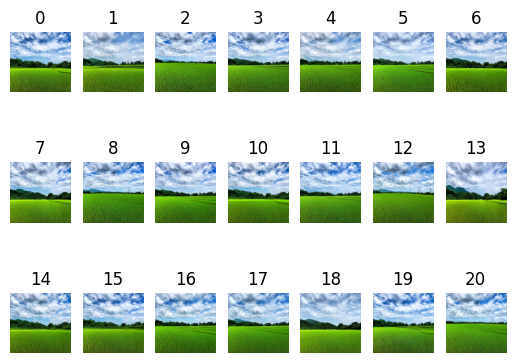

19 6
0 4
3 8
10 10
10 20
13 3
11 5
14 3
6 0
14 11
6 15
6 17
15 1
16 18
12 19
14 9
9 16
11 8
1 18
20 2


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


33


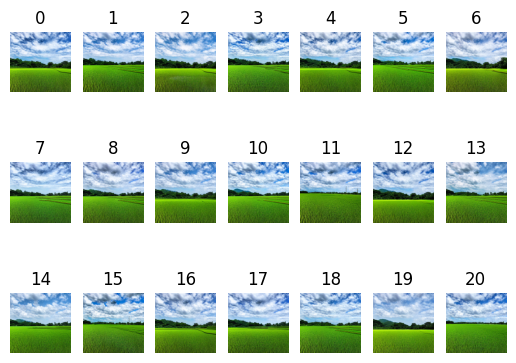

20 16
17 18
3 7
14 12
18 8
15 2
6 1
7 17
19 12
12 3
5 8
1 20
3 0
8 3
20 8
17 17
19 7
12 9
6 6
20 20


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


34


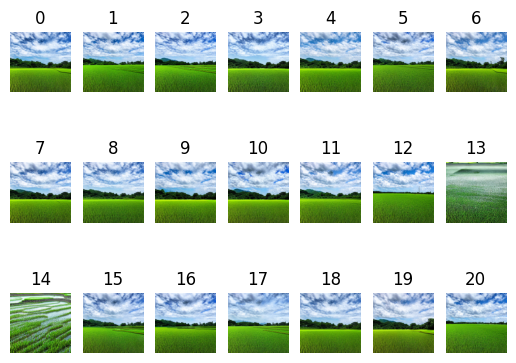

18 2
20 3
17 1
9 10
20 3
9 8
1 5
1 20
11 16
17 8
12 7
7 5
18 3
8 2
5 17
9 15
0 10
0 1
20 11
1 18


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


35


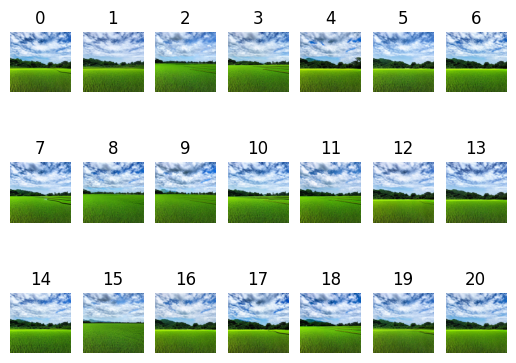

11 20
7 3
2 2
13 7
19 10
16 5
12 19
14 18
5 10
10 18
6 20
17 9
8 2
17 2
16 7
16 2
1 1
7 11
3 7
19 12


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


36


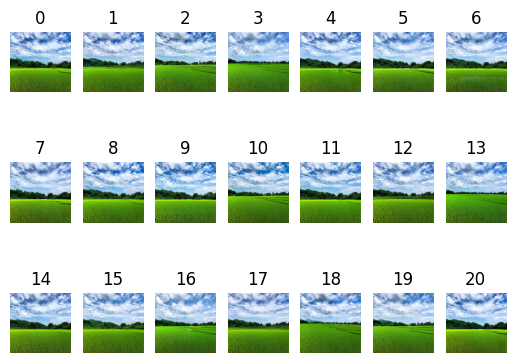

0 7
18 10
7 16
20 12
10 19
0 4
4 2
9 12
6 16
11 14
13 18
8 19
10 16
8 6
17 5
3 11
1 19
20 10
7 2
14 18


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


37


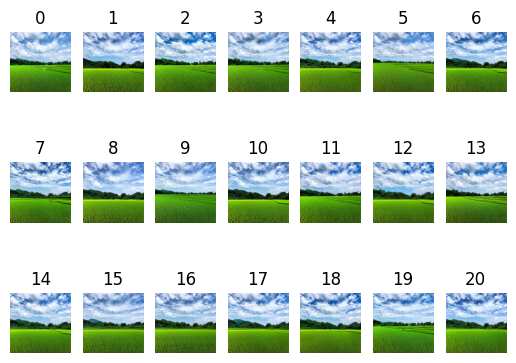

14 14
19 19
1 13
1 6
14 5
17 5
7 0
1 6
7 11
10 5
19 12
11 4
2 17
5 4
18 8
17 3
5 12
2 11
16 6
13 3


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


38


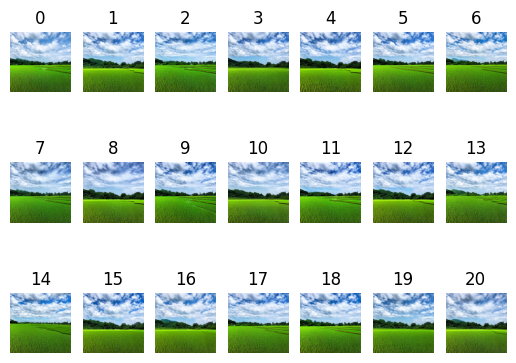

15 14
14 3
16 7
7 10
0 1
17 3
10 10
18 18
10 20
17 20
2 15
12 0
9 17
16 6
9 10
14 9
15 9
9 5
10 12
3 17


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


39


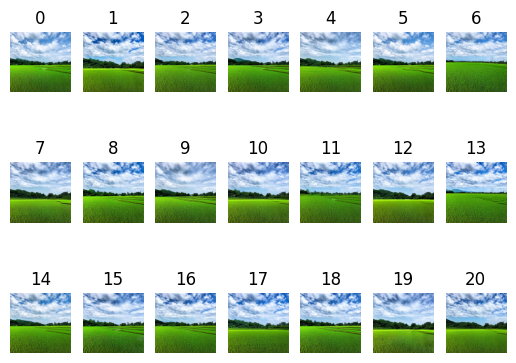

15 2
4 8
17 10
16 0
1 0
2 2
11 9
5 6
1 11
1 17
20 1
15 18
7 10
14 8
2 19
9 19
13 5
4 2
3 20
1 17


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


40


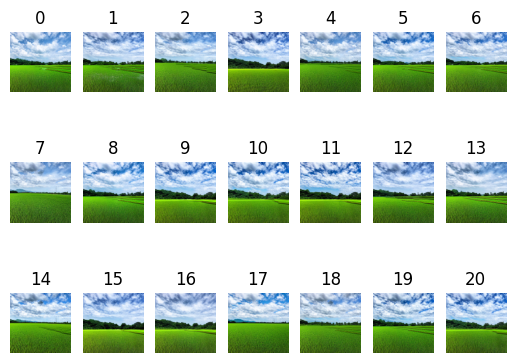

18 5
18 4
13 19
6 5
19 11
17 15
5 12
18 1
8 2
5 3
2 17
6 7
1 8
16 5
19 14
5 11
12 19
9 5
12 5
1 6


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


41


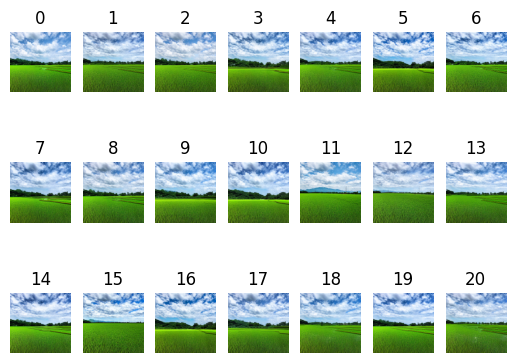

7 20
11 10
7 14
7 14
6 1
20 5
10 18
2 18
3 2
20 5
11 9
7 16
15 16
16 8
5 7
15 1
14 9
0 13
9 14
16 13


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


42


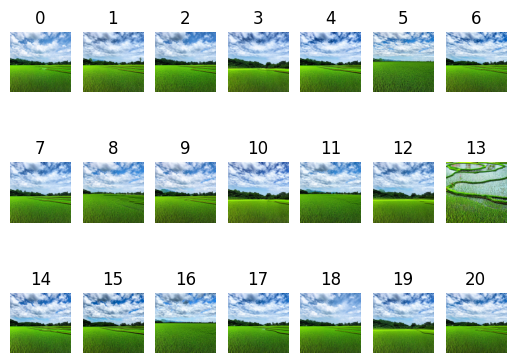

17 8
7 13
4 11
17 19
16 15
0 0
9 15
9 15
19 15
15 0
2 9
1 4
19 6
12 6
6 3
2 10
19 9
0 17
20 12
19 8


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


43


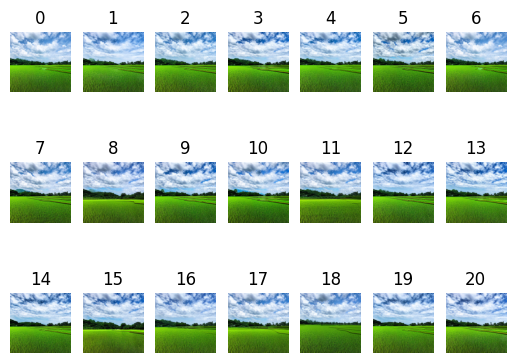

6 17
6 15
7 0
5 5
20 11
5 7
8 13
12 18
16 18
13 13
11 19
16 3
15 12
5 10
2 7
9 16
6 18
4 18
10 17
1 19


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


44


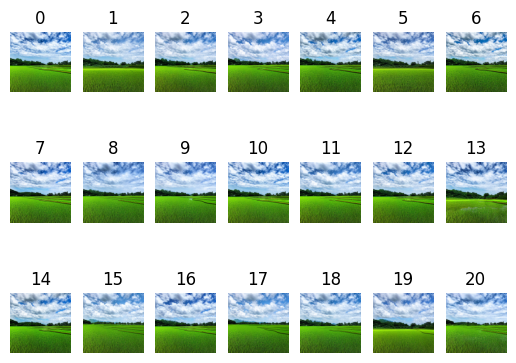

3 2
10 15
17 2
12 18
11 3
20 15
1 4
1 4
10 8
3 10
19 10
16 11
16 11
0 5
11 2
7 16
8 17
20 6
7 19
5 3


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


45


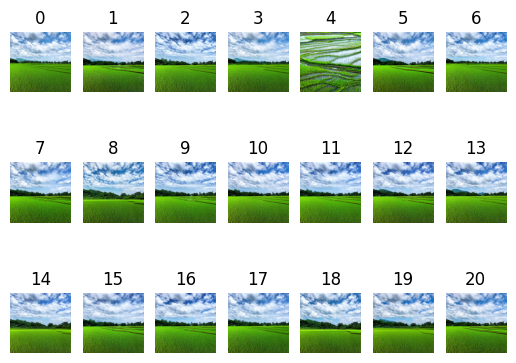

15 16
14 6
6 9
3 5
11 8
17 5
8 13
5 0
3 12
14 5
18 10
18 6
1 1
13 19
8 10
7 16
4 8
1 16
3 14
11 1


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


46


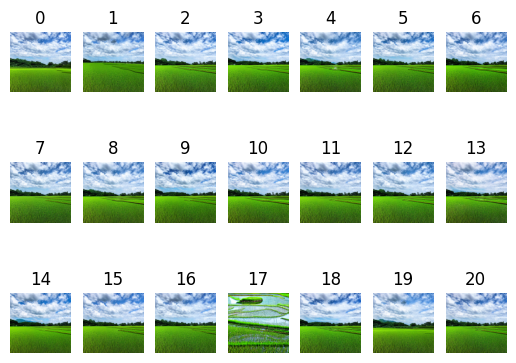

10 14
10 14
14 1
0 11
8 0
3 8
2 15
9 19
6 7
11 0
20 1
17 15
10 18
9 19
10 4
5 6
18 10
15 18
18 13
14 15


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


47


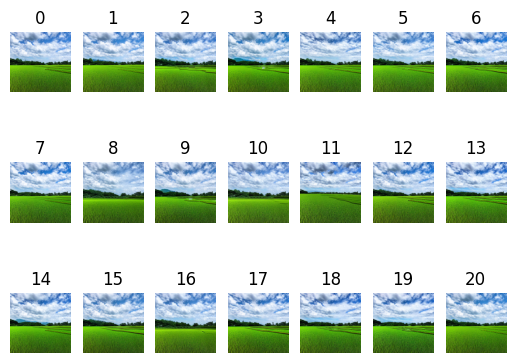

17 2
17 19
20 10
11 8
0 19
2 2
16 9
16 15
0 2
0 6
18 13
3 7
16 8
3 0
6 7
2 9
1 17
19 13
11 18
15 14


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


48


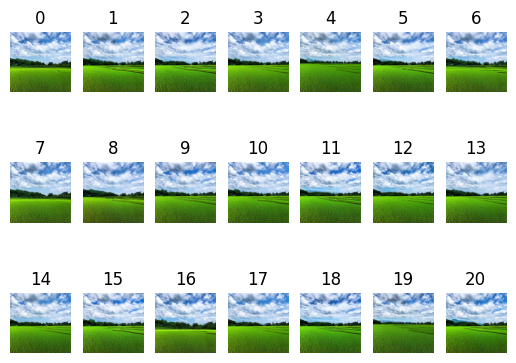

4 1
8 17
8 18
12 0
7 0
8 9
6 15
8 19
11 3
3 1
5 15
20 1
16 12
8 17
14 19
13 14
8 2
13 3
20 15
9 10


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


49


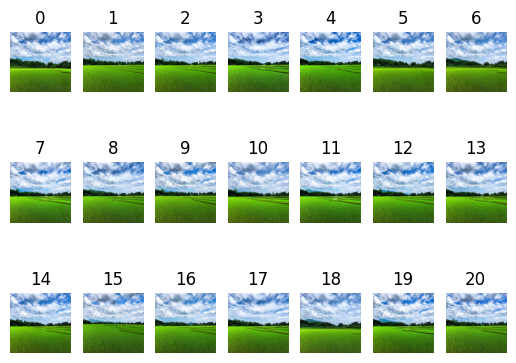

13 2
11 18
8 7
12 6
10 12
18 18
3 16
1 7
12 11
17 3
4 4
14 5
3 2
19 4
8 3
11 3
18 20
2 3
5 2
19 1


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]


50


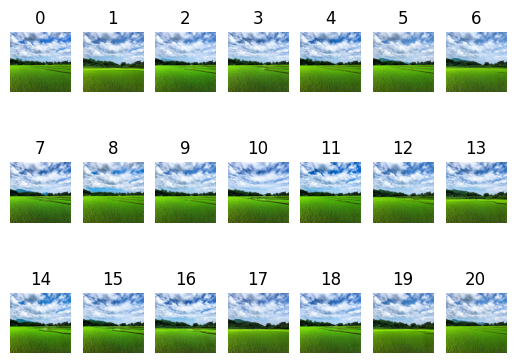

In [183]:
# prompt = ["a photograph of mountain in summer"]
prompt = ["a photograph of a rice field in summer with clear sky"]
target_image = Image.open("glasses.jpg").convert('RGB').resize((512,512))
target = pil2cv(target_image)
genes = initialize_gene()

#初期配置
images = []
for i in range(population):
    image = func(genes[i],prompt)
    images.append(image)
show_image(images,0)
#進化+選択
for i in range(1,generations+1):
    #選択
    fitness = calc_fitness(target,images)
    with open('fitness.txt', 'a') as f:
        print(fitness, file=f)
    #進化
    genes = evolve(fitness,genes)
    #画像生成
    images.clear()
    for j in range(population):
        image = func(genes[j],prompt)
        images.append(image)
    #表示
    show_image(images,i)
fitness = calc_fitness(target,images)
with open('fitness.txt', 'a') as f:
    print(fitness, file=f)

42.61140604823542


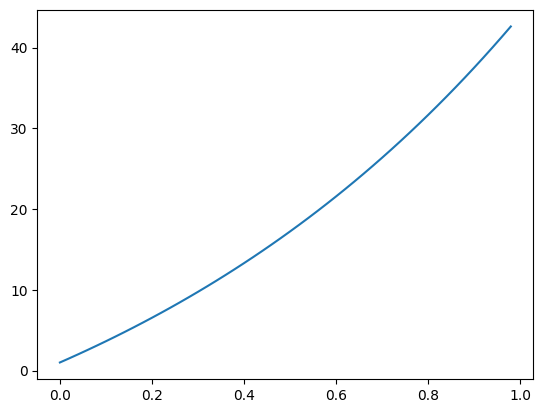

In [120]:
#適合度のグラフ
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(0, 1, 0.02) #-5から5まで0.1区切りで配列を作る
y = 25*(np.exp(x))-24#配列xの値に関してそれぞれsin(x)を求めてy軸の配列を生成
print(y[len(y)-1])
plt.plot(x,y) # この場合のplot関数の第一引数xは、x軸に対応し、第二引数のyがy軸にあたります。
plt.show()

In [171]:
a = [[1,2],[3,4],[5,6]]
a = list(reversed(a))
a = sorted(a)
a

[[1, 2], [3, 4], [5, 6]]